# StainTools Demo

Implementation of a few common stain normalization techniques ([Reinhard](http://ieeexplore.ieee.org/document/946629/), [Macenko](http://ieeexplore.ieee.org/document/5193250/), [Vahadane](http://ieeexplore.ieee.org/document/7164042/)) in Python (tested on 3.5). Please refer to the linked papers for details on the methods.

All techniques have the same API, where we create a stain normalization object or 'Normalizer'. The fit and transform methods are then the most important. In short do something like:

```python
from staintools import ReinhardNormalizer
n = ReinhardNormalizer()
n.fit(target_image)
out = n.transform(source_image)
```

This notebook shows example usage. We show the application of the techniques to a few images (in data folder).

One change to the vanilla methods is used. With all images we first apply a brightness standardizing step (below). This is especially useful in handling the more challenging images (which are typically too dim) and does not damage performance for the other images. 

```python
# Defined in utils/misc_utils
def standardize_brightness(I, percentile=95):
    """
    Standardize brightness
    :param I:
    :return:
    """
    assert is_uint8_image(I)
    I_LAB = cv.cvtColor(I, cv.COLOR_RGB2LAB)
    L = I_LAB[:, :, 0]
    p = np.percentile(L, percentile)
    I_LAB[:, :, 0] = np.clip(255. * L / p, 0, 255).astype(np.uint8)  # 255. float seems to be important...
    I = cv.cvtColor(I_LAB, cv.COLOR_LAB2RGB)
    return I
```

In [1]:
from __future__ import division

from staintools import ReinhardNormalizer
from staintools import MacenkoNormalizer
from staintools import VahadaneNormalizer

from staintools import standardize_brightness
from staintools.utils.visual import read_image, show, show_colors, build_stack, patch_grid

import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
i1 = read_image('./data/i1.png')
i2 = read_image('./data/i2.png')
i3 = read_image('./data/i3.png')
i4 = read_image('./data/i4.png')
i5 = read_image('./data/i5.png')
i6 = read_image('./data/i6.png')
stack = build_stack((i1, i2, i3, i4, i5, i6))

# Brightness 'standardization'

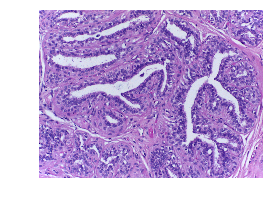

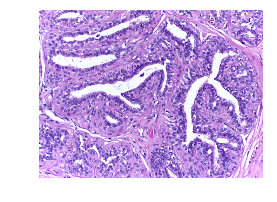

In [3]:
show(i1, fig_size=(4,4))
standard = standardize_brightness(i1)
show(standard, fig_size=(4,4))

# Original images

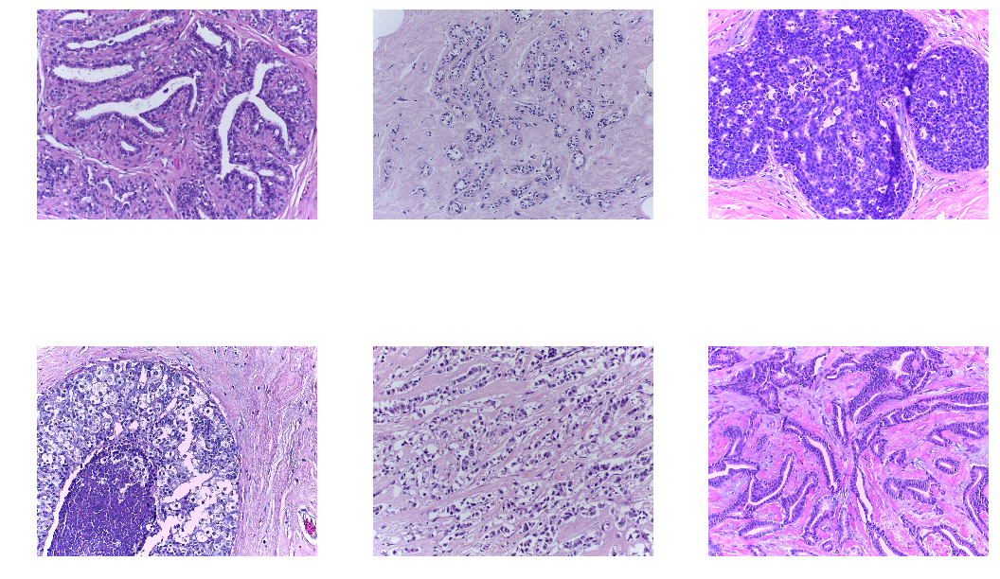

In [4]:
patch_grid(stack, width=3, save_name='./results/original.png')

# Reinhard normalization

In [5]:
n = ReinhardNormalizer()
n.fit(i1)
normalized = build_stack((standard, n.transform(i2), n.transform(
    i3), n.transform(i4), n.transform(i5), n.transform(i6)))

Using brightness standardization


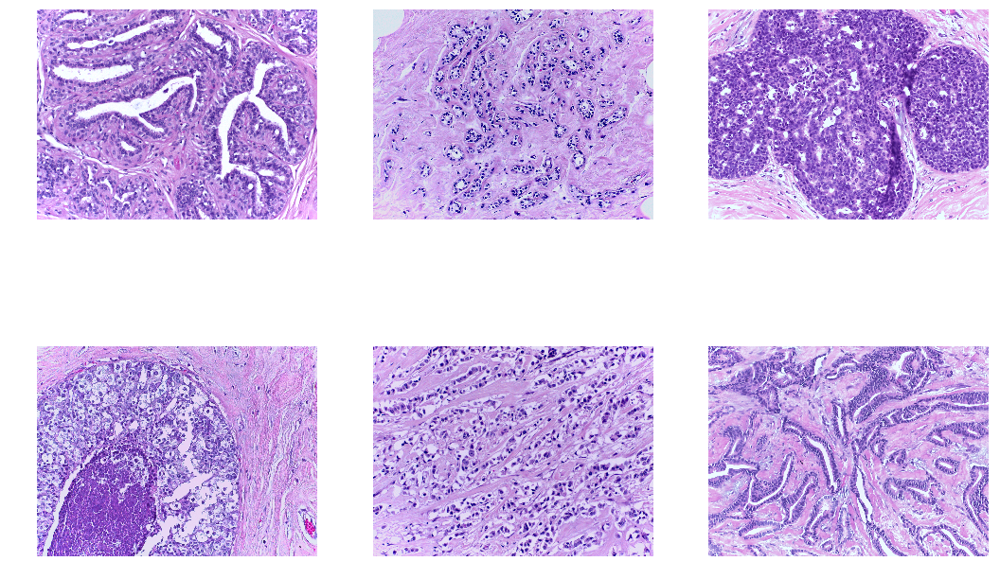

In [6]:
patch_grid(normalized,width=3,save_name='./results/Reinhard.png')

# Macenko normalization

In [7]:
n = MacenkoNormalizer()
n.fit(i1)
normalized = build_stack((standard, n.transform(i2), n.transform(
    i3), n.transform(i4), n.transform(i5), n.transform(i6)))

Using brightness standardization


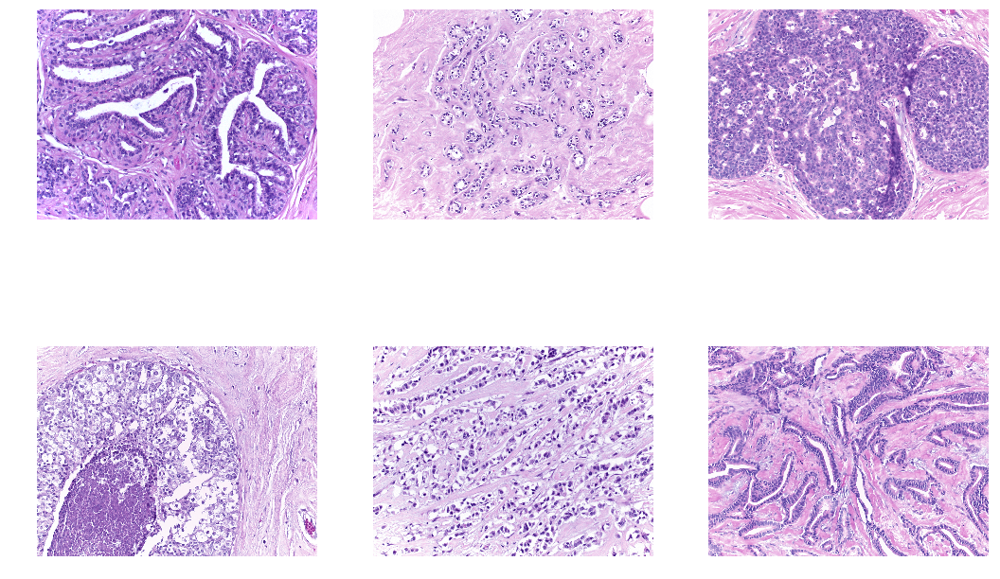

In [8]:
patch_grid(normalized, width=3, save_name='./results/Macenko.png')

## Hematoxylin channel

In [9]:
hemo = build_stack((n.hematoxylin(i1), n.hematoxylin(i2), n.hematoxylin(
    i3), n.hematoxylin(i4), n.hematoxylin(i5), n.hematoxylin(i6)))

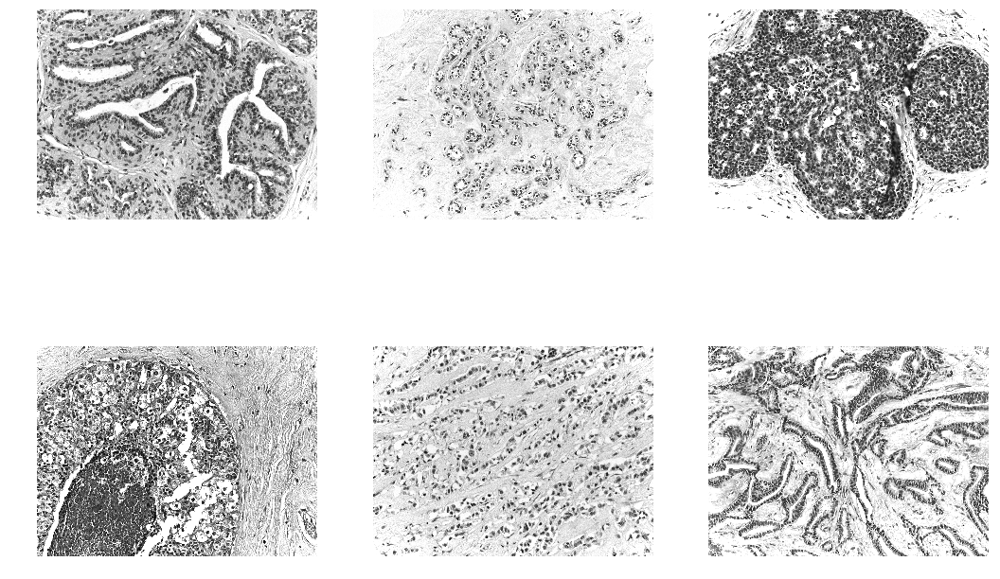

In [10]:
patch_grid(hemo, width=3, save_name='./results/Macenko_hemo.png')

# Vahadane normalization

In [11]:
n = VahadaneNormalizer()
n.fit(i1)
normalized = build_stack((standard, n.transform(i2), n.transform(
    i3), n.transform(i4), n.transform(i5), n.transform(i6)))

Using brightness standardization


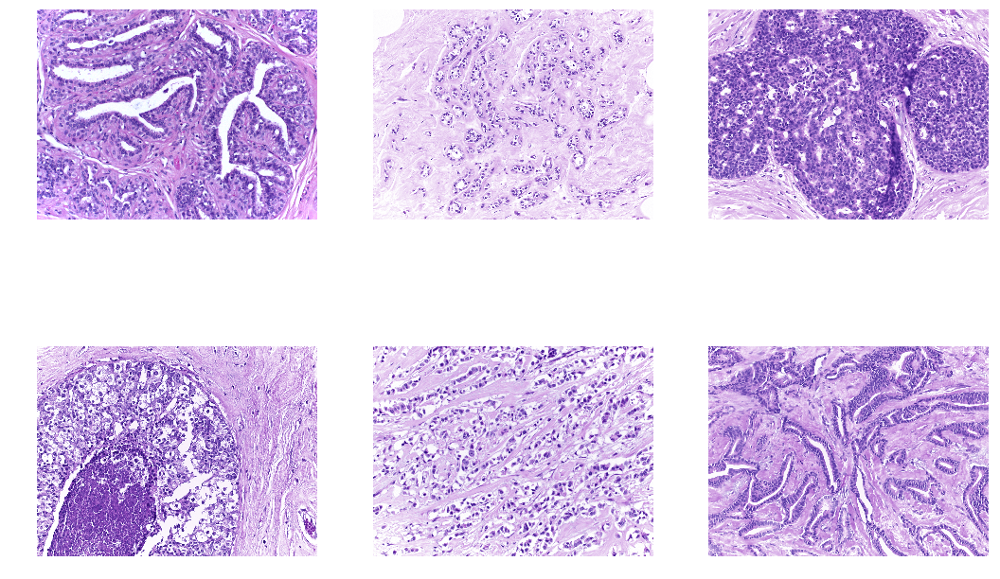

In [12]:
patch_grid(normalized, width=3, save_name='./results/Vahadane.png')

## Hematoxylin channel

In [13]:
hemo = build_stack((n.hematoxylin(i1), n.hematoxylin(i2), n.hematoxylin(
    i3), n.hematoxylin(i4), n.hematoxylin(i5), n.hematoxylin(i6)))

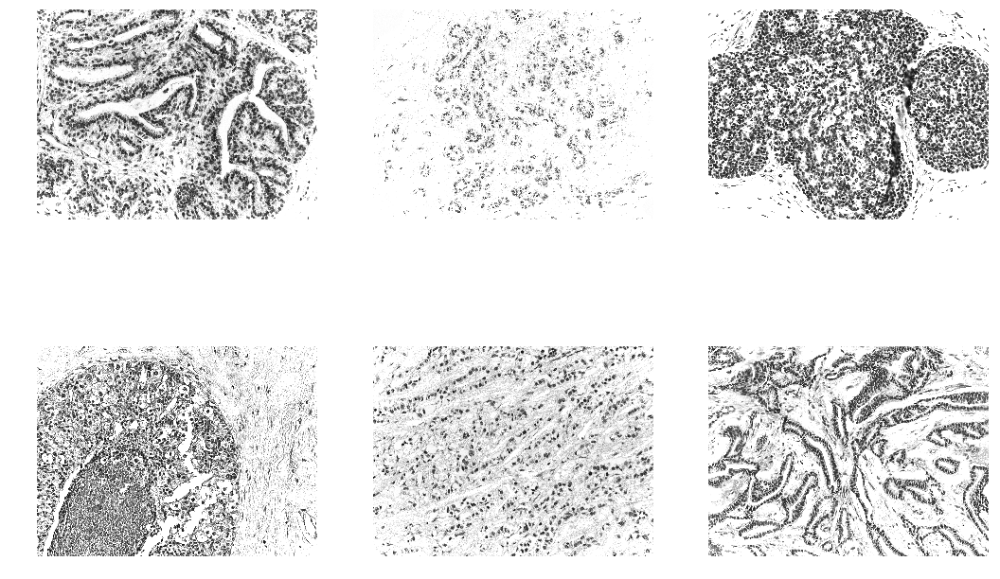

In [14]:
patch_grid(hemo, width=3, save_name='./results/Vahadane_hemo.png')

# More challenging images

In [15]:
i1 = read_image('./data/i1.png')
i7 = read_image('./data/i7.png')
i8 = read_image('./data/i8.png')
i9 = read_image('./data/i9.png')
stack = build_stack((i1, i7, i8, i9))

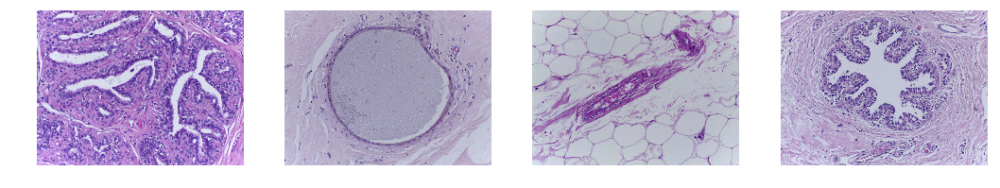

In [16]:
patch_grid(stack, width=4, save_name='./results/challenge_original.png')

## Reinhard

In [17]:
n = ReinhardNormalizer()
n.fit(i1)
normalized = build_stack(
    (standard, n.transform(i7), n.transform(i8), n.transform(i9)))

Using brightness standardization


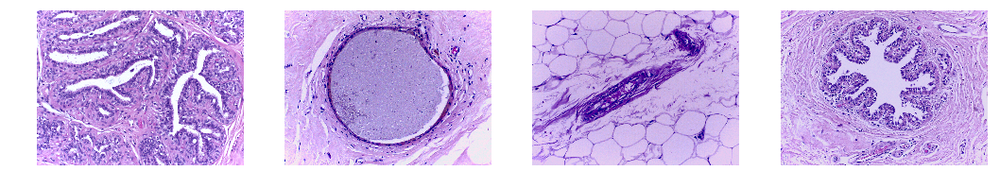

In [18]:
patch_grid(normalized, width=4, save_name='./results/challenge_Reinhard.png')

## Macenko

In [19]:
n = MacenkoNormalizer()
n.fit(i1)
normalized = build_stack(
    (standard, n.transform(i7), n.transform(i8), n.transform(i9)))

Using brightness standardization


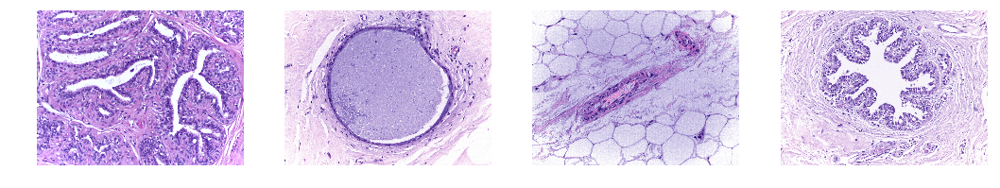

In [20]:
patch_grid(normalized, width=4, save_name='./results/challenge_Macenko.png')

## Vahadane

In [21]:
n = VahadaneNormalizer()
n.fit(i1)
normalized = build_stack(
    (standard, n.transform(i7), n.transform(i8), n.transform(i9)))

Using brightness standardization


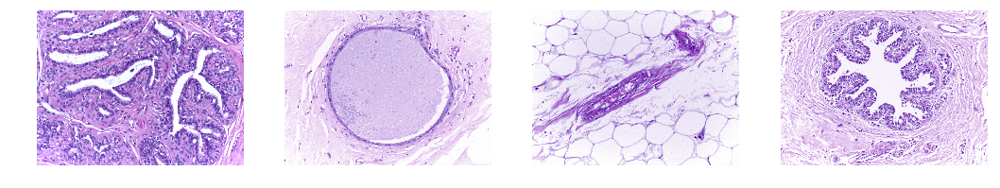

In [22]:
patch_grid(normalized, width=4, save_name='./results/challenge_Vahadane.png')

# Without brightness standardization

## Reinhard

In [23]:
n = ReinhardNormalizer(standardize=False)
n.fit(i1)
normalized = build_stack(
    (i1, n.transform(i7), n.transform(i8), n.transform(i9)))

Not standardizing brightness


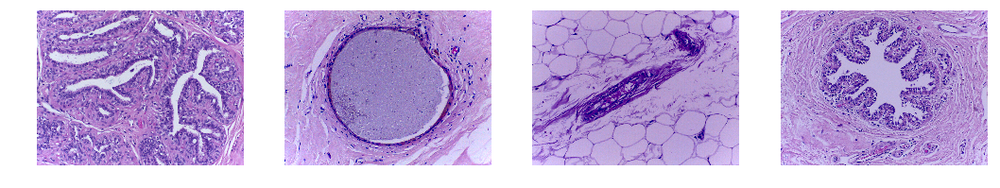

In [24]:
patch_grid(normalized, width=4, save_name='./results/challenge_Reinhard.png')

## Macenko

In [25]:
n = MacenkoNormalizer(standardize=False)
n.fit(i1)
normalized = build_stack(
    (i1, n.transform(i7), n.transform(i8), n.transform(i9)))

Not standardizing brightness


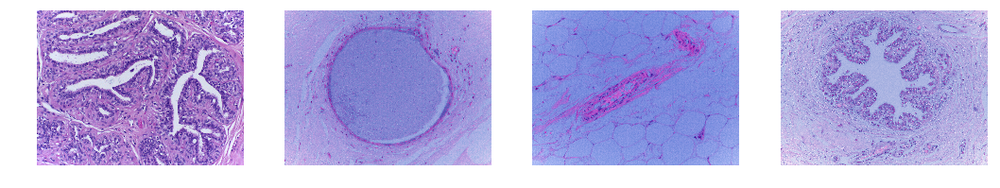

In [26]:
patch_grid(normalized, width=4, save_name='./results/challenge_Macenko.png')

## Vahadane

In [27]:
n = VahadaneNormalizer(standardize=False)
n.fit(i1)
normalized = build_stack(
    (i1, n.transform(i7), n.transform(i8), n.transform(i9)))

Not standardizing brightness


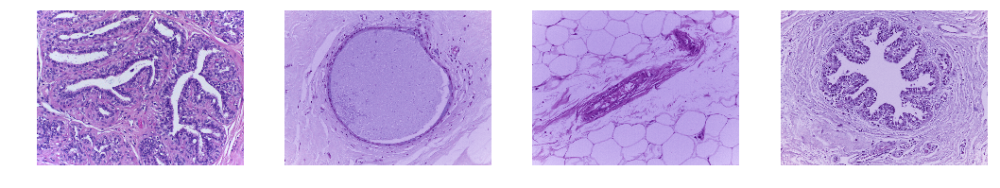

In [28]:
patch_grid(normalized, width=4, save_name='./results/challenge_Vahadane.png')

# Stain extraction

Using brightness standardization


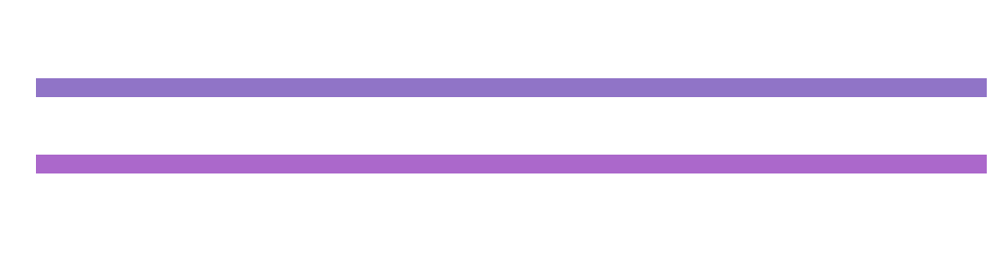

In [29]:
n = VahadaneNormalizer()
n.fit(i1)
show_colors(n.fetch_target_stains())
plt.savefig('./results/stains.png')